## Project Description:<a id='1'></a>
Investors from the Shut Up and Take My Money fund decided to try themselves in a new field and open a catering establishment in Moscow. Customers do not yet know what kind of place it will be: a cafe, a restaurant, a pizzeria, a pub or a bar, and what the location, menu and prices will be.
To begin with, they asked us to prepare a study of the Moscow market, find interesting features and present the results obtained, which in the future will help in choosing a suitable place for investors.
We need to try to make the presentation informative and concise. Its structure and design strongly influence the perception of information by readers of your research. You can choose the tools (matplotlib, seaborn, and others) and the types of visualizations yourself.
A dataset with Moscow catering establishments is available to you, compiled on the basis of data from Yandex Maps and Yandex Business services for the summer of 2022. The information posted in the Yandex Business service could have been added by users or found in publicly available sources. It is purely for reference purposes.

#### Data Description:

* name — the name of the institution;
* category — the category of the institution, for example, "cafe", "pizzeria" or "coffee shop";
* address — the address of the institution;
* district — the administrative district in which the institution is located, for example, the Central Administrative District;
* hours — information about working days and hours;
* lat — latitude of the geographical point where the institution is located;
* lng — the longitude of the geographical point where the institution is located;
* rating — rating of the institution according to user ratings in Yandex Maps (the highest rating is 5.0);
* price — the category of prices in the institution, for example, "average", "below average", "above average" and so on;
* avg_bill — a string that stores the average cost of an order as a range, for example:
 "Average score: 1000-1500 ₽";
 "The price of a cup of cappuccino: 130-220 ₽";
 "The price of a glass of beer: 400-600 ₽".
 etc;
* middle_avg_bill — a number with an estimate of the average check, which is specified only for values from the avg_bill column starting with the substring "Average bill":
If a price range of two values is specified in the row, the median of these two values will be included in the column.
 If a single number is specified in the row — the price without a range, then this number will be included in the column.
 If there is no value or it does not start with the substring "Average score", then nothing will be included in the column.
* middle_coffee_cup is a number with an estimate of one cup of cappuccino, which is specified only for values from the avg_bill column starting with the substring "Price of one cup of cappuccino":
If the price range of two values is specified in the row, the median of these two values will be included in the column.
If a single number is specified in the row — the price without a range, then this number will be included in the column.
If there is no value or it does not start with the substring "Price of one cup of cappuccino", then nothing will be included in the column.
* chain — a number expressed as 0 or 1, which indicates whether the institution is a network (errors may occur for small networks);
* seats — the number of seats.

## 1. Importing libraries.<a id='2'></a>

In [98]:
!pip install folium

import plotly
import plotly.graph_objs as go
import plotly.express as px

from plotly.subplots import make_subplots
from plotly.offline import iplot

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import folium

# connect the module to work with the JSON format
import json

# import map and choropleth
from folium import Map, Choropleth

# import map and marker
from folium import Map, Marker
from folium.plugins import MarkerCluster




In [99]:
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('https://code.s3.yandex.net//datasets/moscow_places.csv')

In [100]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [101]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


#### Conclusion:
* The data types are defined correctly.
* Column names are correct.
*  There are a lot of omissions in the columns that at first glance do not define.
1. Add the columns required by the task.
2. I will replace the string values of the chain field with "network" and "non-network"
3. I will replace "administrative district" with "JSC" in the district field

## 2. Data preprocessing.<a id='3'></a>

In [102]:
df.duplicated().sum() # check duplicates

0

In [103]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()

In [104]:
duplicates = df.duplicated(subset=['name', 'address'], keep=False)
if duplicates.any():
     duplicate_rows = df[duplicates]
     print("Implicit duplicates detected:")
     print(duplicate_rows)
else:
     print("No implicit duplicates found.")

Implicit duplicates detected:
                           name  category  \
189                        кафе      кафе   
215                        кафе      кафе   
1430                  more poke  ресторан   
1511                  more poke  ресторан   
2211  раковарня клешни и хвосты  ресторан   
2420  раковарня клешни и хвосты   бар,паб   
3091            хлеб да выпечка  булочная   
3109            хлеб да выпечка      кафе   

                                      address  \
189              москва, парк ангарские пруды   
215              москва, парк ангарские пруды   
1430  москва, волоколамское шоссе, 11, стр. 2   
1511  москва, волоколамское шоссе, 11, стр. 2   
2211               москва, проспект мира, 118   
2420               москва, проспект мира, 118   
3091              москва, ярцевская улица, 19   
3109              москва, ярцевская улица, 19   

                                     district  \
189           Северный административный округ   
215           Северный а

We found 8 rows of implicit duplicates, I will delete rows with duplicate values (leaving the first occurrence).

In [105]:
df.drop_duplicates(subset=['name', 'address'], inplace=True) # Delet duplicates

In [106]:
df.isnull().sum().sum() # gaps in the DataFrame

26938

In [107]:
df.isnull().sum().sort_values(ascending=False)

middle_coffee_cup    7867
middle_avg_bill      5253
price                5087
avg_bill             4586
seats                3610
hours                 535
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

In [108]:
print(round(df.isnull().sum () / len(df)* 100).sort_values(ascending=False))

middle_coffee_cup    94.0
middle_avg_bill      63.0
price                61.0
avg_bill             55.0
seats                43.0
hours                 6.0
name                  0.0
category              0.0
address               0.0
district              0.0
lat                   0.0
lng                   0.0
rating                0.0
chain                 0.0
dtype: float64


*  middle_coffee_cup 94 % of missing values
*  middle_avg_bill 63 % of missing values
*  price 61 % of missing values
*  avg_bill 55 % of missing values
*  seats 43 % of missing values
*  hours 6 % of missing values

Most skips with middle_coffee_cup, middle_avg_bill, price, avg_bill. The data of these columns are related, so I will work with what is.The number of seats passes can be arranged by fast food outlets where takeaway food is prepared.

In [109]:
# df['district'] = df['district'].str.replace('administrative district', 'JSC') # replace the administrative district with JSC

In [110]:
df['chain'] = df['chain'].astype(str).str.replace('0', 'Not network').replace('1', 'Network') # Replace the values in the chain field

In [111]:
df['street'] = df['address'].str.split(',').str[1] 
df.sample()


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
3756,телебистро,кофейня,"москва, никитский переулок, 7, стр. 2",Центральный административный округ,"пн-пт 07:30–23:00; сб,вс 09:00–23:00",55.757742,37.610462,4.4,средние,Средний счёт:700–1000 ₽,850.0,NaN,Not network,32.0,никитский переулок


In [112]:
df['hours'].tail()

8401      ежедневно, 09:00–02:00
8402      ежедневно, 08:00–22:00
8403    ежедневно, круглосуточно
8404    ежедневно, круглосуточно
8405    ежедневно, круглосуточно
Name: hours, dtype: object

In [113]:
# the function returns True if the string contains the substring "daily, around the clock" otherwise False
def boolean():
     return df['hours'].str.contains('daily, around the clock')

df['is_24/7'] = boolean() # create a column and call the function

df.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,Not network,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,Not network,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,Not network,150.0,люблинская улица,False
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,Network,150.0,люблинская улица,False
8405,kebab time,кафе,"москва, россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,Not network,12.0,россошанский проезд,False


Let's look at the distribution of the average cost of coffee

In [114]:
df['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [115]:
fig = px.histogram(df, x='middle_coffee_cup', nbins=10, marginal='box')

fig.update_layout(
     title='Coffee cost distribution',
     xaxis_title='Coffee cost',
     yaxis_title='Quantity',
     width=900, height=600,
)

fig.show()

There is a value in the distribution of the cost of coffee that goes beyond the bulk of the data.

In [116]:
filtered_df = df[df['middle_coffee_cup'] < np.quantile(df[~df['middle_coffee_cup'].isna()]['middle_coffee_cup'], 0.99)]

fig = px.histogram(filtered_df, x='middle_coffee_cup', nbins=10, marginal='box')
fig.update_layout(
     title='Coffee cost distribution',
     xaxis_title='Coffee cost',
     yaxis_title='Quantity',
     width=900, height=600,
)

fig.show()

When conducting further analysis, I will use only those values that are within the 99th percent quantile.
I will filter the rest from the data

Let's look at the distribution of the average check

In [117]:
df['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [118]:
fig = px.histogram(df, x='middle_avg_bill', nbins=12, marginal='box')

fig.update_layout(
     title='Distribution of the cost of the average bill',
     xaxis_title='Value of check',
     yaxis_title='Quantity',
     width=900, height=600,
)

fig.show()

In [119]:
filtered_df = df[df['middle_avg_bill'] < np.quantile(df[~df['middle_avg_bill'].isna()]['middle_avg_bill'], 0.95)]

fig = px.histogram(filtered_df, x='middle_avg_bill', nbins=12, marginal='box')

fig.update_layout(
     title='Distribution of the cost of the average bill',
     xaxis_title='Value of check',
     yaxis_title='Quantity',
     width=900, height=600,
)

fig.show()

The distribution of the value of the average check has a heavy tail, that is, it contains a small number of values that deviate significantly from the main distribution. Therefore, when further analyzing the data from this column, we will use only values that fall within the limits of the 95 percent quantile.

In [120]:
# Let's check the distribution of passes for the cost of coffee by district for more accurate conclusions
unique_districts = df[df['category'] == 'coffee shop']['district'].unique()

# For each county, calculate the percentage of missing values in the 'middle_coffee_cup' column
for district in unique_districts:
     missing_percentage = round(df[(df['category'] == 'coffee shop') & (df['district'] == district)][
         'middle_coffee_cup'].isna().mean(), 2)
     print(f'{district}: {missing_percentage}')

In [121]:
# Let's check the distribution of passes by average receipt by district for more accurate further conclusions
unique_districts = df['district'].unique()

# For each county, calculate the percentage of missing values in the 'middle_avg_bill' column
for district in unique_districts:
     missing_percentage = round(df[df['district'] == district]['middle_avg_bill'].isna().mean(), 2)
     print(f'{district}: {missing_percentage}')

Северный административный округ: 0.64
Северо-Восточный административный округ: 0.66
Северо-Западный административный округ: 0.62
Западный административный округ: 0.64
Центральный административный округ: 0.53
Восточный административный округ: 0.67
Юго-Восточный административный округ: 0.73
Южный административный округ: 0.65
Юго-Западный административный округ: 0.67


#### Conclusion:
* Checked the data for duplicates
* Determined the number of passes
* Created the necessary columns
* Outliers were found in the distributions of the average receipt and the average cost of coffee. We have defined certain quantiles within which we will analyze the data in these columns. This will allow us to exclude extreme values and focus on the main distribution.
* The gaps in the columns with the average check and the average cost of coffee, grouped by districts, are distributed approximately evenly. This means that the absence of values in these columns is not related to any particular county or group of counties. Such a uniform distribution of omissions may indicate an accidental absence of data in these columns.

## 3. Data Analysis<a id='4'></a>

In [122]:
df[['name', 'category', 'address', 'district']].nunique()

name        5512
category       8
address     5752
district       9
dtype: int64

In the dataset
* 8 categories of establishments
* 9 administrative districts
* 5614 titles
* 5753 unique addresses

In [123]:
df['category'].value_counts()

кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [124]:
# creating a new DataFrame from value_counts()
df_category = pd.DataFrame({'category': df['category'].value_counts().index,
                             'count': df['category'].value_counts().values})

# create a percentage share column
df_category['percent'] = round(df_category['count'] / sum(df_category['count']) * 100, 1)

# average rating by category
rating_category = df.groupby('category', as_index=False)['rating'].agg('mean')

# group by number of seats
df_seats = df.groupby('category', as_index=False)['seats'].agg('sum')

# join tables
df_merged = pd.merge(df_category, round(rating_category, 1), on='category').merge(df_seats, on='category')


df_merged['percent_seats'] = round(df_merged['seats'] / sum(df_merged['seats']) * 100, 1)
df_merged

,category,count,percent,rating,seats,percent_seats
0,кафе,2376,28.3,4.1,118494.0,22.8
1,ресторан,2042,24.3,4.3,154681.0,29.8
2,кофейня,1413,16.8,4.3,83511.0,16.1
3,"бар,паб",764,9.1,4.4,58131.0,11.2
4,пиццерия,633,7.5,4.3,40350.0,7.8
5,быстрое питание,603,7.2,4.1,34513.0,6.6
6,столовая,315,3.7,4.2,16359.0,3.2
7,булочная,256,3.0,4.3,13229.0,2.5


In [125]:
# constructing a histogram
fig = px.bar(df_merged, x='category', y='count',
                    title='Number of establishments by category',
                    labels={"category": "Category"}, # Legend name
                    color='category',
                    text='count')

fig.update_xaxes(title_text='Categories') # Add x-axis label
fig.update_yaxes(title_text='Count') # Add y-axis label

fig.show()

In [126]:
fig = px.pie(df_merged, names='category', values='count',
              width=800, height=600, color='category',
              title='Share number of establishments by category')

fig.show()

As can be seen from the table and graph, the number of establishments by category is distributed as follows:
1. Cafe
2. Restaurant
3. Coffee Shop
4. Bar, pub
5. Pizzeria
6. Fast food
7. Dining room
8. Bakery

In [127]:
# constructing a histogram
fig = px.bar(df_merged, x='category', y='seats',
                    title='Number of places by category',
                    labels={"category": "Category"}, # Legend name
                    text='count',
                    color='category')

fig.update_xaxes(title_text='Categories') # Add x-axis label
fig.update_yaxes(title_text='Count') # Add y-axis label
fig.update_layout(xaxis = {"categoryorder":"total descending"}) # Column order in descending order
fig.show()

In [128]:
fig = px.pie(df_merged, names='category', values='seats',
              width=800, height=600, color='category',
              title='Share number of places by category')

fig.show()

As can be seen from the table and graph, the number of seats by category is distributed as follows:
1. Restaurant
2. Cafe
3. Coffee Shop
4. Bar, pub
5. Pizzeria
6. Fast food
7. Dining room
8. Bakery
*  The same sequence as in the number of establishments, only the number of places in restaurants bypassed cafes.

In [129]:
# Grouping data by category and counting the number of establishments
grouped_data = df.groupby(["category", "chain"]).size().reset_index(name="count")

# Building a chart with bars
fig = px.bar(grouped_data, x="category", y="count", color="chain",
              title='Number of chain and non-chain establishments',
              labels={"chain": "Category"},
              barmode='group', text='count')

fig.update_xaxes(title_text='Categories') # Add x-axis label
fig.update_yaxes(title_text='Count') # Add y-axis label
fig.update_layout(xaxis = {"categoryorder":"total descending"}) # column order in descending order

fig.show()

In [130]:
# Calculation of the share of chain and non-chain establishments
total_counts = grouped_data.groupby("category")["count"].transform("sum")
grouped_data["percent"] = grouped_data["count"] / total_counts * 100

# Plotting a chart with bars and adding shares to the text
fig = px.bar(grouped_data, x="category", y="count", color="chain",
              title='Shares of chain and non-chain establishments',
              labels={"chain": "Category"},
              barmode='group',
              text=grouped_data["percent"].round(2).astype(str) + "%")

fig.update_xaxes(title_text='Categories') # Add x-axis label
fig.update_yaxes(title_text='Count') # Add y-axis label
fig.update_layout(xaxis = {"categoryorder":"total descending"}) # column order in descending order

fig.show()

In [131]:
fig = px.pie(df, names="chain", color='chain',
                 title='Number of chain and non-chain establishments',
                 width=800, height=600)

fig.update_xaxes(title_text='Categories') # Add x-axis label
fig.update_yaxes(title_text='Count') # Add y-axis label

fig.show()

In [132]:
# Data filter for network
network_data = grouped_data[grouped_data["chain"] == "Network"]

# Constructing a pie chart for chain establishments
fig_network = px.pie(network_data, values="count", names="category",
                      width=800, height=600,
                      title="Distribution of chain establishments by category")

# Display charts
fig_network.show()

In [133]:
print(f"Chain establishments: {df[df['chain']== 'Chain']['name'].count()}")
print(f"Non-chain establishments: {df[df['chain']== 'Non-chain']['name'].count()}")
print(f"Chain establishments: {round(df[df['chain']== 'Chain']['name'].count() / len(df) * 100)}%")
print(f"Non-chain establishments: {round(df[df['chain']== 'Non-chain']['name'].count() / len(df) * 100)}%")

Chain establishments: 0
Non-chain establishments: 0
Chain establishments: 0%
Non-chain establishments: 0%


### Output:
* Network establishments: 3205
* Non-chain establishments: 5201
* Chain establishments: 38%
* Non-chain establishments: 62%
##### In terms of shares, most of the chain establishments:
* Bakery 
* Coffee Shop 
* Pizzeria
#####  Also, the networks have a serious share in the category: 
* cafe 
* restaurants 
* fast food.
##### And less in categories: 
* bar, pub 
* dining room.
##### Share of network connections:
* Cafe - 24.3%
* Restaurant - 22.8%
* Coffee shops - 22.5%
* Pizzerias - 10%
The remaining categories are distributed in a smaller ratio, as can be seen on the graph.

In [134]:
# top 15 popular networks in Moscow.
top_15 = df[df['chain'] == 'Network']['name'].value_counts().head(15)
top_15

шоколадница                            120
домино'с пицца                          76
додо пицца                              74
one price coffee                        71
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
cofefest                                32
буханка                                 32
му-му                                   27
Name: name, dtype: int64

In [135]:
# Constructing a histogram
fig = px.bar(top_15, y =top_15.values, x =top_15.index,
              title='TOP 15 networks',
              text=top_15.values,
              color=top_15.index,
              labels={"index": "Category"}, # Legend name
              height=550
             )

fig.update_xaxes(title_text='Network')
fig.update_yaxes(title_text='Quantity')

fig.show()

In the top 15 networks, we see that coffee shops, pizzerias and cafes prevail as well as in the graph above.

In [136]:
df['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [137]:
df_district = pd.DataFrame({'district':df['district'].value_counts().index,
                             'count':df['district'].value_counts().values})

# constructing a histogram
fig = px.bar(df_district, x='district', y='count',
                    title='Number of establishments by district',
                    text='count',
                    color='district',
                    labels={"district": "Administrative district"}, # Legend name
                    height=600)

fig.update_xaxes(title_text='Administrative district') # Add x-axis label
fig.update_yaxes(title_text='Count') # Add y-axis label

fig.show()

* The Central Administrative District is the leader in the number of establishments, ahead of the nearest district by orders of magnitude.
* The smallest number of establishments in the North-Western district. 
* Establishments were distributed more evenly across the rest of the districts.

In [138]:
fig = px.histogram(df, x='district', color='category', barmode='group')

fig.update_layout(xaxis = {"categoryorder":"total descending"}, # column order in descending order
                   legend={"title": "Category"}, # legend title
                   title='Number of establishments by district and category',
                   height=600)

fig.update_xaxes(title_text='County') # Add x-axis label
fig.update_yaxes(title_text='Count') # Add y-axis label

fig.show()

In each district of Moscow, establishments by category are:
* Cafe
* Restaurants
* Coffee shops
* Pizzerias
* Bars and pubs in the Central Administrative District are represented more than pizzerias
And in last place are bakeries and canteens.

In [139]:
# constructing a histogram
fig = px.histogram(df_merged, x='category', y='rating',
                    title='Average rating by category',
                    color='rating')

fig.update_xaxes(title_text='Categories') # Add x-axis label
fig.update_yaxes(title_text='Count', range=[4, 4.5]) # Add y-axis label and output limit

fig.update_layout(xaxis = {"categoryorder":"total descending"}, legend={"title": "Rating"}) # column order in descending order

fig.show()

The average ratings of all the categories presented are above 4, which indicates that they are well fed in the city of Moscow.
* The highest average rating at the Bar,Pub 4.4
* The lowest cafe is 4.2
* The differences are minor and low-high is a relative concept here.

In [140]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median') # Median ratings by administrative districts
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [141]:
# load a JSON file with the boundaries of Moscow districts
try:
     state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
except:
     state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - latitude of the center of Moscow, moscow_lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# creating a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# create a choropleth using the Choropleth constructor and add it to the map
Choropleth(
     geo_data=state_geo,
     data=rating_df,
     columns=['district', 'rating'],
     key_on='feature.name',
     fill_color='GnBu',
     fill_opacity=0.8,
     legend_name='Median rating of establishments by administrative region',
).add_to(m)

# display the map
m

* The institutions of the Central Administrative District have the best average ratings, with an average rating of 4.4.
* The North-Eastern Administrative District and the South-Eastern Administrative District score 4.2 is the lowest.
*  other districts have an average rating of 4.3 establishments
* The eastern part of the capital is still inferior both in the number of establishments and in assessing their quality.

In [142]:
# create an empty cluster and add it to the map
marker_cluster = MarkerCluster().add_to(m)

# write a function that takes a dataframe string,
# creates a marker at the current point and adds it to the marker_cluster cluster
def create_clusters(row):
     Marker(
         [row['lat'], row['lng']],
         popup=f"{row['name']} {row['rating']}",
     ).add_to(marker_cluster)

# apply the create_clusters() function to each row of the dataframe
df.apply(create_clusters, axis=1)

# display the map
m

* The largest cluster of establishments in the Central Administrative District and the South-Western Administrative District.
*  The smallest cluster in the Southern Administrative District and the Northeastern Administrative District.
* The eastern part of the capital has a noticeably smaller number of establishments than the western one.

In [143]:
top_15_street = df.groupby('street')['name'].count().sort_values(ascending=False).head(15)
top_15_street 

street
 проспект мира             183
 профсоюзная улица         122
 проспект вернадского      108
 ленинский проспект        107
 ленинградский проспект     95
 дмитровское шоссе          88
 каширское шоссе            77
 варшавское шоссе           76
 ленинградское шоссе        70
 мкад                       65
 люблинская улица           60
 улица вавилова             55
 кутузовский проспект       54
 улица миклухо-маклая       49
 пятницкая улица            48
Name: name, dtype: int64

In [144]:
# Limit data to first 15 streets
top_15_streets = df['street'].value_counts().head(15).index
df_filtered = df[df['street'].isin(top_15_streets)]

fig = px.histogram(df_filtered, x='street', color='category', height=600)

fig.update_xaxes(title_text='Streets') # Add x-axis label
fig.update_yaxes(title_text='Count') # Add y-axis label

fig.update_layout(xaxis={"categoryorder": "total descending"}, # Column order in descending order
                   legend={"title": "Category"}, # legend title
                   title='Top 15 streets') # chart title
fig.show()

1. The most concentrated street is Mira Avenue.
2. The average concentration of establishments on the streets ranges from 50 to 100.
3. The lowest concentration of bars is observed on Kashirskoye Highway, Kutuzovsky Prospekt, Vavilov Street and MKAD. The highest concentration of bars on Leninsky Prospekt.
4. The highest concentration of fast food is on Mira Avenue, and the lowest is on Kutuzovsky Prospekt, Leningradsky Prospekt, Pyatnitskaya Street and Leninsky Prospekt.
5. Cafes are evenly distributed throughout the district, with the highest concentration on Mira Avenue and MKAD, and the lowest on Pyatnitskaya Street.
6. The greatest concentration of coffee shops is observed on Mira Avenue, and the smallest - on the MKAD and on Miklukho-Maklay Street.
7. Pizzerias are concentrated mainly on Trade Union Street, Vernadsky Avenue and Mira Avenue, while the smallest concentration of pizzerias is observed on Lublin Street.
8. Restaurants are concentrated mainly on Mira Avenue, Vernadsky Avenue and Leninsky Avenue, while the lowest concentration of restaurants is observed on the MKAD.
9. Canteens have the highest concentration on Varshavskoye Highway, and the smallest - on the MKAD.
10. Bakeries are concentrated mainly on Leningradsky Avenue, Mira Avenue, and Trade Union Street, while the smallest concentration of bakeries is observed on Kutuzovsky Avenue and Vernadsky Avenue.

#### Streets with one establishment

In [145]:
streets_with_one_eatery = df.groupby('street')['name'].count() == 1
streets_with_one_eatery = streets_with_one_eatery[streets_with_one_eatery.values == True]

filtered_streets = df[df['street'].isin(streets_with_one_eatery.index)]
filtered_streets.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,Not network,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,Not network,NaN,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,Network,NaN,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,Network,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,Network,NaN,ландшафтный заказник лианозовский,False


In [146]:
filtered_streets.shape

(457, 16)

In [147]:
filtered_streets['street'].nunique() # Streets with one catering establishment

457

In [148]:
filtered_streets.groupby('district')['street'].count().sort_values(ascending=False) # Number of streets with one сфеукштп уыефидшырьуте by district

district
Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: street, dtype: int64

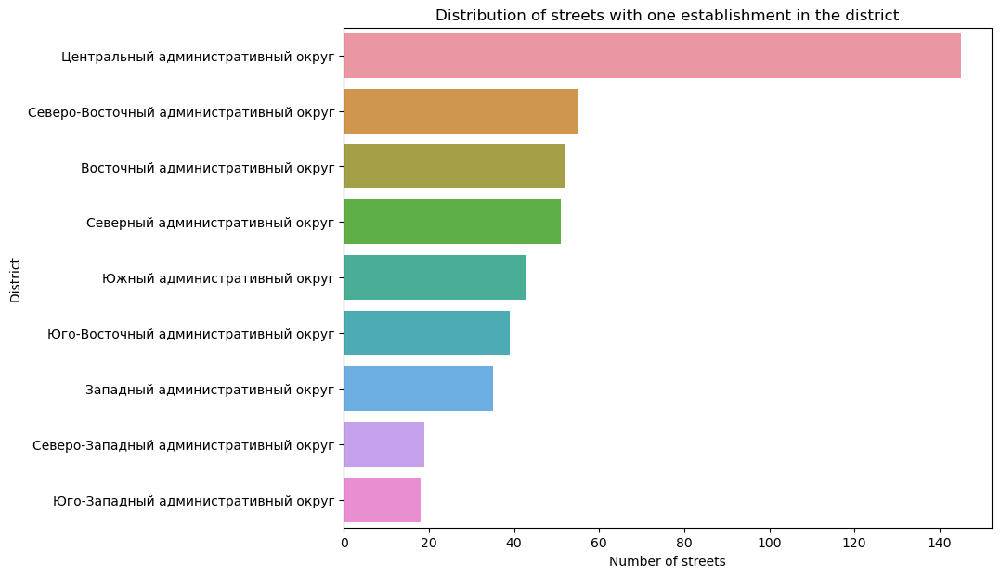

In [149]:
#Color chart
sns.set_palette("Set2")

x = filtered_streets.groupby('district')['street'].count().sort_values(ascending=False)
y = filtered_streets.groupby('district')['street'].count().sort_values(ascending=False).index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=filtered_streets.reset_index())

plt.title('Distribution of streets with one establishment in the district')
plt.xlabel('Number of streets')
plt.ylabel('District')

plt.show()

In addition to the central administrative district, the data show that the entire east from north to south has many more streets with one institution.As well as the Northern Administrative District.

In [150]:
filtered_streets.groupby('category')['street'].count().sort_values(ascending=False) 

category
кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

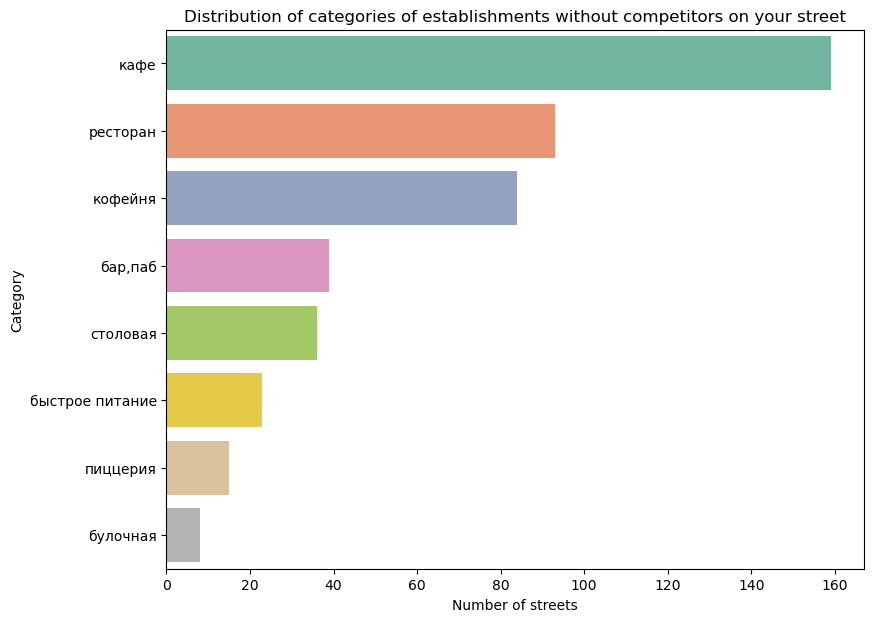

In [151]:
#Color chart
sns.set_palette("Set2")


x = filtered_streets.groupby('category')['street'].count().sort_values(ascending=False)
y = filtered_streets.groupby('category')['street'].count().sort_values(ascending=False).index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=filtered_streets.reset_index())

plt.title('Distribution of categories of establishments without competitors on your street')
plt.xlabel('Number of streets')
plt.ylabel('Category')

plt.show()

The most common institution that is located alone on the street is a cafe. Further restaurants and coffee shops.

In [152]:
rating_st = filtered_streets.groupby('category')['rating'].mean().sort_values(ascending=False).round(1)
rating_st

category
бар,паб            4.5
пиццерия           4.4
булочная           4.3
кофейня            4.3
столовая           4.3
ресторан           4.2
кафе               4.1
быстрое питание    4.1
Name: rating, dtype: float64

In [153]:
# constructing a histogram
fig = px.histogram(rating_st, x=rating_st.index, y=rating_st.values,
                    title='Average rating by category without competitors on the street',
                    color='rating')

fig.update_xaxes(title_text='Categories') # Add x-axis label
fig.update_yaxes(title_text='Count', range=[4, 4.5]) # Add y-axis label and output limit

fig.update_layout(xaxis = {"categoryorder":"total descending"}, legend={"title": "Rating"}) # column order in descending order

fig.show()

The distribution of average ratings by category is very similar to the distribution for the whole population.

#### Explore average bill

In [154]:
df_filtered['middle_avg_bill'].describe()

count      469.000000
mean      1057.665245
std       1807.200053
min         50.000000
25%        400.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [155]:
mean_avg_bill = filtered_df.groupby('district')['middle_avg_bill'].mean().sort_values(ascending=False).round(2)
mean_avg_bill

district
Центральный административный округ         945.12
Западный административный округ            889.81
Северо-Западный административный округ     775.75
Северный административный округ            772.53
Юго-Западный административный округ        741.24
Восточный административный округ           708.29
Южный административный округ               678.92
Северо-Восточный административный округ    647.95
Юго-Восточный административный округ       592.04
Name: middle_avg_bill, dtype: float64

In [156]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

data = mean_avg_bill

folium.Choropleth(
    geo_data= state_geo,
    data=data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Average bill for districts',
).add_to(m)

m

In [163]:
print('Average bill in the Central Administrative District in relation to other districts:', round(
     filtered_df[filtered_df['district'] == 'Центральный административный округ']['middle_avg_bill'].mean() /
     filtered_df[filtered_df['district'] != 'Центральный административный округ']['middle_avg_bill'].mean(), 2))

Average bill in the Central Administrative District in relation to other districts: 1.3


* The highest average check is observed in the CAO (Central Administrative District) and CJSC (Western Administrative District). 
* The lowest average check is noted in the Southern Administrative District (Southern Administrative District), the Northern Administrative District (North-Eastern Administrative District) and the Southern Administrative District (South-Eastern Administrative District).

* On average, the average check in the CAO exceeds the average check in other districts by 30%.
*  Here, too, I would like to note the above-mentioned trends. The eastern part of the capital is inferior to the western one in all indicators, the number of establishments, the average rating of establishments and the average check for establishments.

### Conclusion:
The following observations can be made from the presented dataset. Cafes are the most common category of establishments, while bakeries are the least represented in absolute terms. Cafes have the largest number of establishments in all districts, with the exception of the Central Administrative District (CAO). The relative proportions of cafes in non-central districts are approximately the same.

Cafes and restaurants have the largest number of seats, while bakeries are the least spacious. The total share of non-chain establishments is 62%, while chain establishments make up 38% of the total. This indicates the predominance of independent or small chains of establishments in Moscow. However, certain categories, such as bakeries, coffee shops and pizzerias, have a more significant presence of chain establishments compared to non-chain ones.

The Shokoladnitsa chain is the largest, and there are also two pizzerias in the top 3 in size. The top 15 most widely represented cafes (7), coffee shops (4) and pizzerias (2). Also in the top 15 there is an online store "Yandex Shop".

In general, the most popular categories of establishments are cafes, coffee shops and restaurants, and bars are also distinguished in the CAO. Other categories are less popular. The NWAO has the lowest concentration of establishments in all categories, which may represent the potential for further growth.

* The institutions of the Central Administrative District have the best average ratings, with an average rating of 4.4.
* The North-Eastern Administrative District and the South-Eastern Administrative District score 4.2 is the lowest.
* other districts have an average rating of 4.3 institutions
* The eastern part of the capital is still inferior both in the number of establishments and in assessing their quality.

* The highest average check is in the CAO and CJSC.
* The lowest average check in the Southern Administrative District, the Southern Administrative District and the SVAO.
* On average, a check in the CAO by 30%. higher than in other districts.
* From the outlying districts, the highest average check in CJSC.

## 4. Coffee houses.<a id='5'></a> 

In [170]:
df_coffee_house = df[df['category'] == 'кофейня'].copy()
df_coffee_house.loc[:, 'district'] = df_coffee_house['district'].str.replace('Administrative district', 'JSC')
df_coffee_house.reset_index(drop=True, inplace=True)

df_coffee_house.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,Not network,NaN,улица маршала федоренко,False
1,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,Network,NaN,парк левобережный,False
2,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,Network,46.0,коровинское шоссе,False
3,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,Network,NaN,улица маршала федоренко,False
4,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,Network,NaN,улица дыбенко,False


In [171]:
df_coffee_house[['name', 'district', 'address', 'street']].nunique()

name         826
district       9
address     1215
street       629
dtype: int64

* Coffee shops in all administrative districts of Moscow.
*  Have 839 names.
* There are a total of 1215 caffeine with addresses in Moscow
* All of them are located on 629 streets.
*  From the research above, we remember that chain coffee shops prevail over non-network ones.

In [172]:
district_coffee = pd.DataFrame({'district':df_coffee_house['district'].value_counts().index,
                                'count':df_coffee_house['district'].value_counts().values})
district_coffee

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [173]:
#building a histogram
fig = px.bar(district_coffee, x = 'district', y = 'count',
                    title='Amount of caffeine by districts',
labels={"index": "Administrative District"}, # Legend name
                    color='district',
                    text='count')



fig.show()

In [174]:
fig = px.pie(district_coffee, names='district', values='count', 
             width=900, height=600,
             title='Share amount of caffes by districts')

fig.show()

*  The highest concentration of caffeine in the Central Administrative District (orders of magnitude more than other districts)
* The lowest concentration in the North-Western Administrative District
*  The Northern, Northeastern, Western and Southern administrative districts have dense indicators for the proportion of caffeine.
* The rest of the South-Western, South-Eastern and Eastern administrative Districts have a close low proportion of caffeine.

In [175]:
rating_coffee_house = df_coffee_house.groupby('district')['rating'].mean().sort_values(ascending=False).round(2)
rating_coffee_house

district
Центральный административный округ         4.34
Северо-Западный административный округ     4.33
Северный административный округ            4.29
Юго-Западный административный округ        4.28
Восточный административный округ           4.28
Южный административный округ               4.23
Юго-Восточный административный округ       4.23
Северо-Восточный административный округ    4.22
Западный административный округ            4.20
Name: rating, dtype: float64

In [176]:
# constructing a histogram
fig = px.histogram(rating_coffee_house, x=rating_coffee_house.index, y=rating_coffee_house.values,
                    title='Ratings by area',
                    color= rating_coffee_house.values,
                    height= 600)

fig.update_xaxes(title_text='Categories') # Add x-axis label
fig.update_yaxes(title_text='Rating', range=[3.3, 5]) # Add y-axis label and output limit

fig.update_layout(xaxis = {"categoryorder":"total descending"}, legend={"title": "Rating"}) # column order in descending order

fig.show()

As can be seen from the graph, the ratings of caffeine are at a good level, the fluctuations are insignificant and the median values for all districts 4.2 and 4.3. Coffee in Moscow is at the level.

In [177]:
df_coffee_house.groupby('district')['middle_coffee_cup'].mean().round(2).sort_values(ascending=False)

district
Западный административный округ            189.94
Центральный административный округ         187.52
Юго-Западный административный округ        184.18
Восточный административный округ           174.02
Северный административный округ            165.79
Северо-Западный административный округ     165.52
Северо-Восточный административный округ    165.33
Южный административный округ               158.49
Юго-Восточный административный округ       151.09
Name: middle_coffee_cup, dtype: float64

* The most expensive cups of coffee on average in Western AO, Central AO and Southwestern AO.
* The cheapest in the Southeastern and Southern districts. 
* Everything else is in the middle.
Judging by the ratings, cheap does not mean bad.

In [178]:
print(f"Median price of a cup of coffee in the city: {round(df_coffee_house['middle_coffee_cup'].median(), 2)}")

Median price of a cup of coffee in the city: 170.0


In [184]:
print('Average cost of a cup of coffee in a non-chain coffee shop', round(
        df_coffee_house[df_coffee_house['chain'] == 'Not network']
        ['middle_coffee_cup'].mean(),1)
        )

print('Average cost of a cup of cappuccino in a chain coffee shop', round(
        df_coffee_house[df_coffee_house['chain'] == 'Network']
        ['middle_coffee_cup'].mean(),1)
        )

Average cost of a cup of coffee in a non-chain coffee shop 177.3
Average cost of a cup of cappuccino in a chain coffee shop 172.8


The price for a cup of coffee in non-chain coffee shops is on average 5 rubles higher.

In [185]:
df_coffee_house['hours'].value_counts()

ежедневно, 10:00–22:00                                  140
ежедневно, 08:00–22:00                                   60
ежедневно, круглосуточно                                 59
ежедневно, 09:00–22:00                                   57
пн-пт 08:00–19:00                                        46
                                                       ... 
ежедневно, 10:00–18:00                                    1
пн-чт 09:00–21:40; пт,сб 09:00–22:40; вс 09:00–21:40      1
пн-чт 11:00–23:00; пт,сб 11:00–02:00; вс 11:00–23:00      1
пн-пт 09:00–22:00; сб,вс 09:00–23:00                      1
пн-пт 08:30–19:30                                         1
Name: hours, Length: 362, dtype: int64

In [186]:
# Coffee shops open 24 hours a day
open_coffee_house = df_coffee_house[df_coffee_house['hours'] == 'ежедневно, круглосуточно'].copy()
open_coffee_house.reset_index(drop=True, inplace=True)

open_coffee_house.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,Network,20.0,дмитровское шоссе,False
1,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,Network,25.0,ярославское шоссе,False
2,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,Network,NaN,ярославское шоссе,False
3,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,Network,NaN,мкад,False
4,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,Network,200.0,улица народного ополчения,False


In [187]:
open_district_coffee = open_coffee_house['district'].value_counts()
open_district_coffee

Центральный административный округ         26
Западный административный округ             9
Юго-Западный административный округ         7
Северный административный округ             5
Восточный административный округ            5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Юго-Восточный административный округ        1
Южный административный округ                1
Name: district, dtype: int64

In [188]:
fig = px.pie(open_district_coffee, names=open_district_coffee.index,
              values=open_district_coffee.values, width=800, height=600,
              title='Share of caffeine by district')

fig.show()

In [189]:
open_coffee_house.groupby('district')['middle_coffee_cup'].mean().round(2).sort_values(ascending=False)

district
Северный административный округ            285.00
Юго-Западный административный округ        249.50
Западный административный округ            245.33
Центральный административный округ         217.40
Северо-Восточный административный округ    170.00
Восточный административный округ           110.00
Северо-Западный административный округ        NaN
Юго-Восточный административный округ          NaN
Южный административный округ                  NaN
Name: middle_coffee_cup, dtype: float64

#### Conclusion:
There are districts where the amount of caffeine is small. Especially with a 24/7 schedule.
* North-Eastern Autonomous District - 3
* North-Western Autonomous District - 2
* South-Eastern Autonomous District - 1
* Southern Autonomous District - 1
* And in my opinion, this is a prospect for opening a coffee shop within this particular work schedule.
*No competition in these areas.
* There is a high probability of creating your own “party” in these areas.
* The price of a cup of coffee is more expensive than in chain establishments.
With a careful approach to choosing a location, taking into account traffic, the location of educational institutions and other criteria.

* Well, you can try to cost your network.